In [1]:
pip install torchsummary


Note: you may need to restart the kernel to use updated packages.


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, random_split
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Using device: {device}')

# Hyperparameters
num_epochs = 300
batch_size = 512
learning_rate = 0.0003
dropout_rate = 0.7
validation_split = 0.2

# Data Augmentation and Normalization
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(32, padding=4),
    transforms.RandomGrayscale(p=0.1),
    transforms.RandomRotation(degrees=60),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Load CIFAR-10 Dataset
dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)

# Split into training and validation sets
val_size = int(len(dataset) * validation_split)
train_size = len(dataset) - val_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(dataset=val_dataset, batch_size=batch_size, shuffle=False)

test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

# Define the CNN Model
class CNN(nn.Module):
    def __init__(self, use_dropout=False):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.fc1 = nn.Linear(256 * 4 * 4, 256)
        self.fc2 = nn.Linear(256, 10)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.use_dropout = use_dropout
        self.dropout1 = nn.Dropout(dropout_rate) if use_dropout else nn.Identity()
        self.dropout2 = nn.Dropout(dropout_rate) if use_dropout else nn.Identity()

    def forward(self, x):
        x = self.pool(nn.functional.relu(self.conv1(x)))
        x = self.pool(nn.functional.relu(self.conv2(x)))
        x = self.pool(nn.functional.relu(self.conv3(x)))
        x = x.view(-1, 256 * 4 * 4)
        x = self.dropout1(nn.functional.relu(self.fc1(x)))
        x = self.dropout2(nn.functional.relu(x))
        x = self.fc2(x)
        return x


Using device: cuda


100%|██████████| 170498071/170498071 [00:04<00:00, 34927441.15it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


In [3]:

# Function to train the model
def train_model(model, train_loader, val_loader, num_epochs):
    model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    train_losses, val_accuracies = [], []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        progress_bar = tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}", leave=False)

        for images, labels in progress_bar:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        train_losses.append(running_loss / len(train_loader))

        # Validation phase
        model.eval()
        val_predictions, val_labels = [], []
        with torch.no_grad():
            for images, labels in tqdm(val_loader, desc="Validating", leave=False):
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                _, predicted = torch.max(outputs.data, 1)
                val_predictions.extend(predicted.cpu().numpy())
                val_labels.extend(labels.cpu().numpy())

        val_accuracy = accuracy_score(val_labels, val_predictions) * 100
        val_accuracies.append(val_accuracy)
        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {running_loss / len(train_loader):.4f}, '
              f'Validation Accuracy: {val_accuracy:.2f}%')

    return train_losses, val_accuracies


In [4]:
# Train model without dropout
model_no_dropout = CNN(use_dropout=False)

# Train model with dropout
model_with_dropout = CNN(use_dropout=True)


In [5]:
from torchsummary import summary

# Print summaries of the models
def print_model_summary(model, input_size=(3, 32, 32)):
    model.to(device)
    summary(model, input_size=input_size)

# Check the summary of the model without dropout
print("Summary of the model without dropout:")
print_model_summary(model_no_dropout)

# Check the summary of the model with dropout
print("\nSummary of the model with dropout:")
print_model_summary(model_with_dropout)


Summary of the model without dropout:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,792
         MaxPool2d-2           [-1, 64, 16, 16]               0
            Conv2d-3          [-1, 128, 16, 16]          73,856
         MaxPool2d-4            [-1, 128, 8, 8]               0
            Conv2d-5            [-1, 256, 8, 8]         295,168
         MaxPool2d-6            [-1, 256, 4, 4]               0
            Linear-7                  [-1, 256]       1,048,832
          Identity-8                  [-1, 256]               0
          Identity-9                  [-1, 256]               0
           Linear-10                   [-1, 10]           2,570
Total params: 1,422,218
Trainable params: 1,422,218
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.01
Forward/backward pass size (MB

In [6]:
print('normal model')
train_losses_no_dropout, val_accuracies_no_dropout = train_model(model_no_dropout, train_loader, val_loader, num_epochs)
print('dropout model')
train_losses_with_dropout, val_accuracies_with_dropout = train_model(model_with_dropout, train_loader, val_loader, num_epochs)

normal model


Epoch 1/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [1/300], Loss: 2.0235, Validation Accuracy: 31.89%


Epoch 2/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [2/300], Loss: 1.7848, Validation Accuracy: 35.86%


Epoch 3/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [3/300], Loss: 1.6965, Validation Accuracy: 38.60%


Epoch 4/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [4/300], Loss: 1.6409, Validation Accuracy: 41.24%


Epoch 5/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [5/300], Loss: 1.5922, Validation Accuracy: 41.60%


Epoch 6/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [6/300], Loss: 1.5646, Validation Accuracy: 44.65%


Epoch 7/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [7/300], Loss: 1.5304, Validation Accuracy: 44.24%


Epoch 8/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [8/300], Loss: 1.5002, Validation Accuracy: 44.42%


Epoch 9/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [9/300], Loss: 1.4703, Validation Accuracy: 46.41%


Epoch 10/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [10/300], Loss: 1.4479, Validation Accuracy: 47.17%


Epoch 11/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [11/300], Loss: 1.4251, Validation Accuracy: 49.83%


Epoch 12/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [12/300], Loss: 1.4059, Validation Accuracy: 48.93%


Epoch 13/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [13/300], Loss: 1.3861, Validation Accuracy: 50.77%


Epoch 14/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [14/300], Loss: 1.3620, Validation Accuracy: 49.43%


Epoch 15/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [15/300], Loss: 1.3554, Validation Accuracy: 51.08%


Epoch 16/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [16/300], Loss: 1.3330, Validation Accuracy: 51.94%


Epoch 17/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [17/300], Loss: 1.3119, Validation Accuracy: 52.60%


Epoch 18/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [18/300], Loss: 1.2883, Validation Accuracy: 53.69%


Epoch 19/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [19/300], Loss: 1.2832, Validation Accuracy: 54.42%


Epoch 20/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [20/300], Loss: 1.2492, Validation Accuracy: 54.00%


Epoch 21/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [21/300], Loss: 1.2413, Validation Accuracy: 55.70%


Epoch 22/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [22/300], Loss: 1.2306, Validation Accuracy: 55.27%


Epoch 23/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [23/300], Loss: 1.2221, Validation Accuracy: 57.16%


Epoch 24/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [24/300], Loss: 1.1948, Validation Accuracy: 55.78%


Epoch 25/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [25/300], Loss: 1.1876, Validation Accuracy: 57.21%


Epoch 26/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [26/300], Loss: 1.1759, Validation Accuracy: 57.48%


Epoch 27/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [27/300], Loss: 1.1608, Validation Accuracy: 59.04%


Epoch 28/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [28/300], Loss: 1.1453, Validation Accuracy: 59.28%


Epoch 29/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [29/300], Loss: 1.1366, Validation Accuracy: 58.50%


Epoch 30/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [30/300], Loss: 1.1261, Validation Accuracy: 57.82%


Epoch 31/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [31/300], Loss: 1.1154, Validation Accuracy: 60.10%


Epoch 32/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [32/300], Loss: 1.1035, Validation Accuracy: 60.36%


Epoch 33/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [33/300], Loss: 1.0986, Validation Accuracy: 59.80%


Epoch 34/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [34/300], Loss: 1.0857, Validation Accuracy: 59.59%


Epoch 35/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [35/300], Loss: 1.0767, Validation Accuracy: 60.35%


Epoch 36/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [36/300], Loss: 1.0689, Validation Accuracy: 61.03%


Epoch 37/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [37/300], Loss: 1.0557, Validation Accuracy: 61.82%


Epoch 38/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [38/300], Loss: 1.0497, Validation Accuracy: 62.08%


Epoch 39/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [39/300], Loss: 1.0438, Validation Accuracy: 60.98%


Epoch 40/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [40/300], Loss: 1.0386, Validation Accuracy: 62.57%


Epoch 41/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [41/300], Loss: 1.0297, Validation Accuracy: 62.39%


Epoch 42/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [42/300], Loss: 1.0243, Validation Accuracy: 62.50%


Epoch 43/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [43/300], Loss: 1.0114, Validation Accuracy: 63.50%


Epoch 44/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [44/300], Loss: 1.0005, Validation Accuracy: 63.44%


Epoch 45/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [45/300], Loss: 0.9986, Validation Accuracy: 63.93%


Epoch 46/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [46/300], Loss: 0.9978, Validation Accuracy: 62.93%


Epoch 47/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [47/300], Loss: 0.9814, Validation Accuracy: 64.95%


Epoch 48/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [48/300], Loss: 0.9791, Validation Accuracy: 64.27%


Epoch 49/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [49/300], Loss: 0.9776, Validation Accuracy: 63.74%


Epoch 50/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [50/300], Loss: 0.9680, Validation Accuracy: 64.71%


Epoch 51/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [51/300], Loss: 0.9611, Validation Accuracy: 63.00%


Epoch 52/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [52/300], Loss: 0.9677, Validation Accuracy: 63.13%


Epoch 53/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [53/300], Loss: 0.9520, Validation Accuracy: 66.04%


Epoch 54/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [54/300], Loss: 0.9450, Validation Accuracy: 65.12%


Epoch 55/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [55/300], Loss: 0.9412, Validation Accuracy: 64.92%


Epoch 56/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [56/300], Loss: 0.9390, Validation Accuracy: 65.16%


Epoch 57/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [57/300], Loss: 0.9315, Validation Accuracy: 65.48%


Epoch 58/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [58/300], Loss: 0.9205, Validation Accuracy: 65.94%


Epoch 59/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [59/300], Loss: 0.9224, Validation Accuracy: 64.99%


Epoch 60/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [60/300], Loss: 0.9182, Validation Accuracy: 66.07%


Epoch 61/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [61/300], Loss: 0.9104, Validation Accuracy: 65.75%


Epoch 62/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [62/300], Loss: 0.9054, Validation Accuracy: 66.03%


Epoch 63/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [63/300], Loss: 0.9022, Validation Accuracy: 66.16%


Epoch 64/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [64/300], Loss: 0.8995, Validation Accuracy: 66.68%


Epoch 65/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [65/300], Loss: 0.8934, Validation Accuracy: 65.32%


Epoch 66/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [66/300], Loss: 0.8896, Validation Accuracy: 66.22%


Epoch 67/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [67/300], Loss: 0.8844, Validation Accuracy: 67.27%


Epoch 68/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [68/300], Loss: 0.8757, Validation Accuracy: 67.46%


Epoch 69/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [69/300], Loss: 0.8761, Validation Accuracy: 67.36%


Epoch 70/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [70/300], Loss: 0.8683, Validation Accuracy: 67.09%


Epoch 71/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [71/300], Loss: 0.8669, Validation Accuracy: 66.42%


Epoch 72/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [72/300], Loss: 0.8600, Validation Accuracy: 66.65%


Epoch 73/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [73/300], Loss: 0.8587, Validation Accuracy: 67.59%


Epoch 74/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [74/300], Loss: 0.8574, Validation Accuracy: 67.25%


Epoch 75/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [75/300], Loss: 0.8551, Validation Accuracy: 67.47%


Epoch 76/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [76/300], Loss: 0.8420, Validation Accuracy: 66.59%


Epoch 77/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [77/300], Loss: 0.8423, Validation Accuracy: 67.56%


Epoch 78/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [78/300], Loss: 0.8411, Validation Accuracy: 68.12%


Epoch 79/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [79/300], Loss: 0.8392, Validation Accuracy: 67.03%


Epoch 80/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [80/300], Loss: 0.8393, Validation Accuracy: 68.61%


Epoch 81/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [81/300], Loss: 0.8299, Validation Accuracy: 68.15%


Epoch 82/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [82/300], Loss: 0.8285, Validation Accuracy: 69.12%


Epoch 83/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [83/300], Loss: 0.8241, Validation Accuracy: 68.79%


Epoch 84/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [84/300], Loss: 0.8171, Validation Accuracy: 69.17%


Epoch 85/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [85/300], Loss: 0.8112, Validation Accuracy: 69.18%


Epoch 86/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [86/300], Loss: 0.8035, Validation Accuracy: 69.37%


Epoch 87/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [87/300], Loss: 0.7958, Validation Accuracy: 69.16%


Epoch 88/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [88/300], Loss: 0.7967, Validation Accuracy: 69.46%


Epoch 89/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [89/300], Loss: 0.8020, Validation Accuracy: 68.43%


Epoch 90/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [90/300], Loss: 0.8038, Validation Accuracy: 69.84%


Epoch 91/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [91/300], Loss: 0.7934, Validation Accuracy: 69.33%


Epoch 92/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [92/300], Loss: 0.7860, Validation Accuracy: 69.24%


Epoch 93/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [93/300], Loss: 0.7839, Validation Accuracy: 69.41%


Epoch 94/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [94/300], Loss: 0.7880, Validation Accuracy: 69.29%


Epoch 95/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [95/300], Loss: 0.7800, Validation Accuracy: 69.45%


Epoch 96/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [96/300], Loss: 0.7809, Validation Accuracy: 69.16%


Epoch 97/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [97/300], Loss: 0.7775, Validation Accuracy: 69.89%


Epoch 98/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [98/300], Loss: 0.7738, Validation Accuracy: 69.84%


Epoch 99/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [99/300], Loss: 0.7630, Validation Accuracy: 69.86%


Epoch 100/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [100/300], Loss: 0.7655, Validation Accuracy: 70.57%


Epoch 101/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [101/300], Loss: 0.7565, Validation Accuracy: 69.42%


Epoch 102/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [102/300], Loss: 0.7566, Validation Accuracy: 70.63%


Epoch 103/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [103/300], Loss: 0.7582, Validation Accuracy: 69.12%


Epoch 104/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [104/300], Loss: 0.7468, Validation Accuracy: 69.98%


Epoch 105/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [105/300], Loss: 0.7422, Validation Accuracy: 70.84%


Epoch 106/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [106/300], Loss: 0.7511, Validation Accuracy: 70.63%


Epoch 107/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [107/300], Loss: 0.7456, Validation Accuracy: 70.26%


Epoch 108/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [108/300], Loss: 0.7322, Validation Accuracy: 70.28%


Epoch 109/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [109/300], Loss: 0.7404, Validation Accuracy: 69.71%


Epoch 110/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [110/300], Loss: 0.7360, Validation Accuracy: 70.31%


Epoch 111/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [111/300], Loss: 0.7325, Validation Accuracy: 70.72%


Epoch 112/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [112/300], Loss: 0.7278, Validation Accuracy: 70.13%


Epoch 113/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [113/300], Loss: 0.7236, Validation Accuracy: 70.33%


Epoch 114/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [114/300], Loss: 0.7266, Validation Accuracy: 71.50%


Epoch 115/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [115/300], Loss: 0.7194, Validation Accuracy: 71.50%


Epoch 116/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [116/300], Loss: 0.7208, Validation Accuracy: 70.71%


Epoch 117/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [117/300], Loss: 0.7242, Validation Accuracy: 71.63%


Epoch 118/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [118/300], Loss: 0.7113, Validation Accuracy: 70.80%


Epoch 119/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [119/300], Loss: 0.7177, Validation Accuracy: 71.70%


Epoch 120/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [120/300], Loss: 0.7131, Validation Accuracy: 71.28%


Epoch 121/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [121/300], Loss: 0.7073, Validation Accuracy: 71.95%


Epoch 122/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [122/300], Loss: 0.7082, Validation Accuracy: 71.64%


Epoch 123/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [123/300], Loss: 0.6988, Validation Accuracy: 71.66%


Epoch 124/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [124/300], Loss: 0.7032, Validation Accuracy: 70.59%


Epoch 125/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [125/300], Loss: 0.7074, Validation Accuracy: 71.29%


Epoch 126/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [126/300], Loss: 0.6949, Validation Accuracy: 71.30%


Epoch 127/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [127/300], Loss: 0.6940, Validation Accuracy: 71.66%


Epoch 128/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [128/300], Loss: 0.6893, Validation Accuracy: 72.44%


Epoch 129/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [129/300], Loss: 0.6818, Validation Accuracy: 71.45%


Epoch 130/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [130/300], Loss: 0.6928, Validation Accuracy: 71.96%


Epoch 131/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [131/300], Loss: 0.6865, Validation Accuracy: 72.38%


Epoch 132/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [132/300], Loss: 0.6809, Validation Accuracy: 72.22%


Epoch 133/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [133/300], Loss: 0.6783, Validation Accuracy: 71.56%


Epoch 134/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [134/300], Loss: 0.6784, Validation Accuracy: 72.32%


Epoch 135/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [135/300], Loss: 0.6732, Validation Accuracy: 72.65%


Epoch 136/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [136/300], Loss: 0.6714, Validation Accuracy: 71.96%


Epoch 137/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [137/300], Loss: 0.6709, Validation Accuracy: 71.98%


Epoch 138/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [138/300], Loss: 0.6731, Validation Accuracy: 71.83%


Epoch 139/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [139/300], Loss: 0.6677, Validation Accuracy: 72.81%


Epoch 140/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [140/300], Loss: 0.6658, Validation Accuracy: 72.65%


Epoch 141/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [141/300], Loss: 0.6596, Validation Accuracy: 72.28%


Epoch 142/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [142/300], Loss: 0.6603, Validation Accuracy: 71.82%


Epoch 143/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [143/300], Loss: 0.6568, Validation Accuracy: 72.51%


Epoch 144/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [144/300], Loss: 0.6528, Validation Accuracy: 71.98%


Epoch 145/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [145/300], Loss: 0.6506, Validation Accuracy: 71.80%


Epoch 146/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [146/300], Loss: 0.6516, Validation Accuracy: 72.84%


Epoch 147/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [147/300], Loss: 0.6480, Validation Accuracy: 72.81%


Epoch 148/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [148/300], Loss: 0.6515, Validation Accuracy: 72.37%


Epoch 149/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [149/300], Loss: 0.6402, Validation Accuracy: 72.02%


Epoch 150/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [150/300], Loss: 0.6408, Validation Accuracy: 73.18%


Epoch 151/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [151/300], Loss: 0.6416, Validation Accuracy: 72.45%


Epoch 152/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [152/300], Loss: 0.6461, Validation Accuracy: 72.17%


Epoch 153/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [153/300], Loss: 0.6430, Validation Accuracy: 72.58%


Epoch 154/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [154/300], Loss: 0.6400, Validation Accuracy: 72.55%


Epoch 155/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [155/300], Loss: 0.6337, Validation Accuracy: 72.44%


Epoch 156/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [156/300], Loss: 0.6357, Validation Accuracy: 72.85%


Epoch 157/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [157/300], Loss: 0.6371, Validation Accuracy: 73.16%


Epoch 158/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [158/300], Loss: 0.6296, Validation Accuracy: 72.95%


Epoch 159/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [159/300], Loss: 0.6269, Validation Accuracy: 73.07%


Epoch 160/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [160/300], Loss: 0.6285, Validation Accuracy: 73.43%


Epoch 161/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [161/300], Loss: 0.6284, Validation Accuracy: 73.19%


Epoch 162/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [162/300], Loss: 0.6261, Validation Accuracy: 72.59%


Epoch 163/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [163/300], Loss: 0.6268, Validation Accuracy: 73.45%


Epoch 164/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [164/300], Loss: 0.6139, Validation Accuracy: 72.82%


Epoch 165/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [165/300], Loss: 0.6173, Validation Accuracy: 73.23%


Epoch 166/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [166/300], Loss: 0.6149, Validation Accuracy: 73.34%


Epoch 167/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [167/300], Loss: 0.6151, Validation Accuracy: 72.76%


Epoch 168/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [168/300], Loss: 0.6167, Validation Accuracy: 73.28%


Epoch 169/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [169/300], Loss: 0.6042, Validation Accuracy: 73.76%


Epoch 170/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [170/300], Loss: 0.6103, Validation Accuracy: 74.06%


Epoch 171/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [171/300], Loss: 0.6076, Validation Accuracy: 73.29%


Epoch 172/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [172/300], Loss: 0.6061, Validation Accuracy: 74.02%


Epoch 173/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [173/300], Loss: 0.6103, Validation Accuracy: 73.26%


Epoch 174/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [174/300], Loss: 0.6057, Validation Accuracy: 74.50%


Epoch 175/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [175/300], Loss: 0.5939, Validation Accuracy: 73.28%


Epoch 176/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [176/300], Loss: 0.5915, Validation Accuracy: 74.03%


Epoch 177/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [177/300], Loss: 0.5956, Validation Accuracy: 73.63%


Epoch 178/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [178/300], Loss: 0.5917, Validation Accuracy: 73.02%


Epoch 179/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [179/300], Loss: 0.5918, Validation Accuracy: 73.54%


Epoch 180/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [180/300], Loss: 0.5928, Validation Accuracy: 73.56%


Epoch 181/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [181/300], Loss: 0.5929, Validation Accuracy: 74.27%


Epoch 182/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [182/300], Loss: 0.5863, Validation Accuracy: 73.62%


Epoch 183/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [183/300], Loss: 0.5822, Validation Accuracy: 73.63%


Epoch 184/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [184/300], Loss: 0.5799, Validation Accuracy: 73.31%


Epoch 185/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [185/300], Loss: 0.5856, Validation Accuracy: 73.61%


Epoch 186/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [186/300], Loss: 0.5869, Validation Accuracy: 74.07%


Epoch 187/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [187/300], Loss: 0.5776, Validation Accuracy: 74.01%


Epoch 188/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [188/300], Loss: 0.5738, Validation Accuracy: 73.67%


Epoch 189/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [189/300], Loss: 0.5816, Validation Accuracy: 73.75%


Epoch 190/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [190/300], Loss: 0.5734, Validation Accuracy: 74.20%


Epoch 191/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [191/300], Loss: 0.5735, Validation Accuracy: 73.51%


Epoch 192/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [192/300], Loss: 0.5763, Validation Accuracy: 74.03%


Epoch 193/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [193/300], Loss: 0.5716, Validation Accuracy: 74.06%


Epoch 194/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [194/300], Loss: 0.5664, Validation Accuracy: 73.59%


Epoch 195/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [195/300], Loss: 0.5708, Validation Accuracy: 74.17%


Epoch 196/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [196/300], Loss: 0.5690, Validation Accuracy: 74.17%


Epoch 197/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [197/300], Loss: 0.5671, Validation Accuracy: 74.30%


Epoch 198/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [198/300], Loss: 0.5690, Validation Accuracy: 74.38%


Epoch 199/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [199/300], Loss: 0.5610, Validation Accuracy: 74.21%


Epoch 200/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [200/300], Loss: 0.5618, Validation Accuracy: 74.29%


Epoch 201/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [201/300], Loss: 0.5594, Validation Accuracy: 74.25%


Epoch 202/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [202/300], Loss: 0.5654, Validation Accuracy: 74.53%


Epoch 203/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [203/300], Loss: 0.5560, Validation Accuracy: 74.39%


Epoch 204/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [204/300], Loss: 0.5575, Validation Accuracy: 74.00%


Epoch 205/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [205/300], Loss: 0.5519, Validation Accuracy: 74.35%


Epoch 206/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [206/300], Loss: 0.5527, Validation Accuracy: 74.77%


Epoch 207/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [207/300], Loss: 0.5472, Validation Accuracy: 74.16%


Epoch 208/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [208/300], Loss: 0.5567, Validation Accuracy: 74.04%


Epoch 209/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [209/300], Loss: 0.5504, Validation Accuracy: 74.52%


Epoch 210/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [210/300], Loss: 0.5527, Validation Accuracy: 74.58%


Epoch 211/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [211/300], Loss: 0.5402, Validation Accuracy: 75.06%


Epoch 212/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [212/300], Loss: 0.5464, Validation Accuracy: 74.65%


Epoch 213/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [213/300], Loss: 0.5442, Validation Accuracy: 74.77%


Epoch 214/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [214/300], Loss: 0.5368, Validation Accuracy: 75.08%


Epoch 215/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [215/300], Loss: 0.5400, Validation Accuracy: 74.69%


Epoch 216/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [216/300], Loss: 0.5353, Validation Accuracy: 75.03%


Epoch 217/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [217/300], Loss: 0.5380, Validation Accuracy: 74.62%


Epoch 218/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [218/300], Loss: 0.5370, Validation Accuracy: 74.51%


Epoch 219/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [219/300], Loss: 0.5289, Validation Accuracy: 74.18%


Epoch 220/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [220/300], Loss: 0.5302, Validation Accuracy: 74.80%


Epoch 221/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [221/300], Loss: 0.5310, Validation Accuracy: 74.59%


Epoch 222/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [222/300], Loss: 0.5309, Validation Accuracy: 75.65%


Epoch 223/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [223/300], Loss: 0.5313, Validation Accuracy: 75.01%


Epoch 224/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [224/300], Loss: 0.5352, Validation Accuracy: 74.17%


Epoch 225/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [225/300], Loss: 0.5284, Validation Accuracy: 75.04%


Epoch 226/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [226/300], Loss: 0.5215, Validation Accuracy: 74.19%


Epoch 227/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [227/300], Loss: 0.5234, Validation Accuracy: 75.08%


Epoch 228/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [228/300], Loss: 0.5211, Validation Accuracy: 74.89%


Epoch 229/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [229/300], Loss: 0.5254, Validation Accuracy: 74.64%


Epoch 230/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [230/300], Loss: 0.5190, Validation Accuracy: 75.04%


Epoch 231/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [231/300], Loss: 0.5213, Validation Accuracy: 74.73%


Epoch 232/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [232/300], Loss: 0.5243, Validation Accuracy: 75.47%


Epoch 233/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [233/300], Loss: 0.5222, Validation Accuracy: 75.51%


Epoch 234/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [234/300], Loss: 0.5155, Validation Accuracy: 75.14%


Epoch 235/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [235/300], Loss: 0.5201, Validation Accuracy: 74.58%


Epoch 236/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [236/300], Loss: 0.5205, Validation Accuracy: 75.44%


Epoch 237/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [237/300], Loss: 0.5133, Validation Accuracy: 75.32%


Epoch 238/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [238/300], Loss: 0.5102, Validation Accuracy: 74.91%


Epoch 239/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [239/300], Loss: 0.5093, Validation Accuracy: 74.62%


Epoch 240/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [240/300], Loss: 0.5080, Validation Accuracy: 75.00%


Epoch 241/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [241/300], Loss: 0.5070, Validation Accuracy: 75.29%


Epoch 242/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [242/300], Loss: 0.5086, Validation Accuracy: 75.07%


Epoch 243/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [243/300], Loss: 0.5067, Validation Accuracy: 74.95%


Epoch 244/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [244/300], Loss: 0.5047, Validation Accuracy: 74.27%


Epoch 245/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [245/300], Loss: 0.5136, Validation Accuracy: 74.79%


Epoch 246/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [246/300], Loss: 0.5126, Validation Accuracy: 74.99%


Epoch 247/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [247/300], Loss: 0.4999, Validation Accuracy: 75.85%


Epoch 248/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [248/300], Loss: 0.5045, Validation Accuracy: 75.17%


Epoch 249/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [249/300], Loss: 0.4975, Validation Accuracy: 75.45%


Epoch 250/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [250/300], Loss: 0.4928, Validation Accuracy: 74.65%


Epoch 251/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [251/300], Loss: 0.5036, Validation Accuracy: 75.55%


Epoch 252/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [252/300], Loss: 0.4981, Validation Accuracy: 74.41%


Epoch 253/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [253/300], Loss: 0.4952, Validation Accuracy: 74.43%


Epoch 254/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [254/300], Loss: 0.4980, Validation Accuracy: 75.05%


Epoch 255/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [255/300], Loss: 0.4997, Validation Accuracy: 75.81%


Epoch 256/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [256/300], Loss: 0.4906, Validation Accuracy: 75.05%


Epoch 257/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [257/300], Loss: 0.5002, Validation Accuracy: 75.43%


Epoch 258/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [258/300], Loss: 0.4934, Validation Accuracy: 74.85%


Epoch 259/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [259/300], Loss: 0.4894, Validation Accuracy: 75.50%


Epoch 260/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [260/300], Loss: 0.4968, Validation Accuracy: 75.64%


Epoch 261/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [261/300], Loss: 0.4869, Validation Accuracy: 75.54%


Epoch 262/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [262/300], Loss: 0.4965, Validation Accuracy: 75.39%


Epoch 263/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [263/300], Loss: 0.4880, Validation Accuracy: 75.54%


Epoch 264/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [264/300], Loss: 0.4854, Validation Accuracy: 74.92%


Epoch 265/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [265/300], Loss: 0.4819, Validation Accuracy: 74.68%


Epoch 266/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [266/300], Loss: 0.4846, Validation Accuracy: 75.21%


Epoch 267/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [267/300], Loss: 0.4902, Validation Accuracy: 75.77%


Epoch 268/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [268/300], Loss: 0.4779, Validation Accuracy: 75.06%


Epoch 269/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [269/300], Loss: 0.4788, Validation Accuracy: 74.85%


Epoch 270/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [270/300], Loss: 0.4822, Validation Accuracy: 74.87%


Epoch 271/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [271/300], Loss: 0.4731, Validation Accuracy: 75.51%


Epoch 272/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [272/300], Loss: 0.4757, Validation Accuracy: 75.56%


Epoch 273/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [273/300], Loss: 0.4740, Validation Accuracy: 75.50%


Epoch 274/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [274/300], Loss: 0.4724, Validation Accuracy: 74.69%


Epoch 275/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [275/300], Loss: 0.4702, Validation Accuracy: 75.45%


Epoch 276/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [276/300], Loss: 0.4751, Validation Accuracy: 75.62%


Epoch 277/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [277/300], Loss: 0.4712, Validation Accuracy: 74.93%


Epoch 278/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [278/300], Loss: 0.4815, Validation Accuracy: 75.62%


Epoch 279/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [279/300], Loss: 0.4649, Validation Accuracy: 74.96%


Epoch 280/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [280/300], Loss: 0.4680, Validation Accuracy: 75.52%


Epoch 281/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [281/300], Loss: 0.4624, Validation Accuracy: 75.93%


Epoch 282/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [282/300], Loss: 0.4674, Validation Accuracy: 75.50%


Epoch 283/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [283/300], Loss: 0.4651, Validation Accuracy: 75.44%


Epoch 284/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [284/300], Loss: 0.4681, Validation Accuracy: 75.40%


Epoch 285/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [285/300], Loss: 0.4636, Validation Accuracy: 75.14%


Epoch 286/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [286/300], Loss: 0.4687, Validation Accuracy: 75.11%


Epoch 287/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [287/300], Loss: 0.4625, Validation Accuracy: 76.15%


Epoch 288/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [288/300], Loss: 0.4649, Validation Accuracy: 75.00%


Epoch 289/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [289/300], Loss: 0.4671, Validation Accuracy: 76.07%


Epoch 290/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [290/300], Loss: 0.4584, Validation Accuracy: 76.03%


Epoch 291/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [291/300], Loss: 0.4548, Validation Accuracy: 76.52%


Epoch 292/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [292/300], Loss: 0.4579, Validation Accuracy: 75.85%


Epoch 293/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [293/300], Loss: 0.4652, Validation Accuracy: 75.54%


Epoch 294/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [294/300], Loss: 0.4590, Validation Accuracy: 75.49%


Epoch 295/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [295/300], Loss: 0.4617, Validation Accuracy: 75.78%


Epoch 296/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [296/300], Loss: 0.4584, Validation Accuracy: 76.02%


Epoch 297/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [297/300], Loss: 0.4505, Validation Accuracy: 75.14%


Epoch 298/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [298/300], Loss: 0.4540, Validation Accuracy: 76.05%


Epoch 299/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [299/300], Loss: 0.4515, Validation Accuracy: 75.43%


Epoch 300/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [300/300], Loss: 0.4504, Validation Accuracy: 75.42%
dropout model


Epoch 1/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [1/300], Loss: 2.2309, Validation Accuracy: 26.11%


Epoch 2/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [2/300], Loss: 2.1132, Validation Accuracy: 30.88%


Epoch 3/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [3/300], Loss: 2.0394, Validation Accuracy: 34.14%


Epoch 4/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [4/300], Loss: 1.9960, Validation Accuracy: 34.81%


Epoch 5/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [5/300], Loss: 1.9586, Validation Accuracy: 36.04%


Epoch 6/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [6/300], Loss: 1.9319, Validation Accuracy: 37.02%


Epoch 7/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [7/300], Loss: 1.9020, Validation Accuracy: 37.03%


Epoch 8/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [8/300], Loss: 1.8758, Validation Accuracy: 38.91%


Epoch 9/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [9/300], Loss: 1.8462, Validation Accuracy: 39.35%


Epoch 10/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [10/300], Loss: 1.8202, Validation Accuracy: 40.81%


Epoch 11/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [11/300], Loss: 1.7983, Validation Accuracy: 42.59%


Epoch 12/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [12/300], Loss: 1.7851, Validation Accuracy: 42.57%


Epoch 13/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [13/300], Loss: 1.7611, Validation Accuracy: 43.48%


Epoch 14/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [14/300], Loss: 1.7459, Validation Accuracy: 44.86%


Epoch 15/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [15/300], Loss: 1.7259, Validation Accuracy: 46.17%


Epoch 16/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [16/300], Loss: 1.7070, Validation Accuracy: 46.07%


Epoch 17/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [17/300], Loss: 1.6942, Validation Accuracy: 45.95%


Epoch 18/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [18/300], Loss: 1.6758, Validation Accuracy: 46.52%


Epoch 19/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [19/300], Loss: 1.6633, Validation Accuracy: 46.60%


Epoch 20/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [20/300], Loss: 1.6494, Validation Accuracy: 46.63%


Epoch 21/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [21/300], Loss: 1.6370, Validation Accuracy: 49.22%


Epoch 22/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [22/300], Loss: 1.6178, Validation Accuracy: 49.22%


Epoch 23/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [23/300], Loss: 1.6113, Validation Accuracy: 49.20%


Epoch 24/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [24/300], Loss: 1.6008, Validation Accuracy: 49.46%


Epoch 25/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [25/300], Loss: 1.5847, Validation Accuracy: 49.92%


Epoch 26/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [26/300], Loss: 1.5745, Validation Accuracy: 50.69%


Epoch 27/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [27/300], Loss: 1.5613, Validation Accuracy: 49.82%


Epoch 28/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [28/300], Loss: 1.5544, Validation Accuracy: 52.35%


Epoch 29/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [29/300], Loss: 1.5465, Validation Accuracy: 51.82%


Epoch 30/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [30/300], Loss: 1.5371, Validation Accuracy: 52.62%


Epoch 31/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [31/300], Loss: 1.5237, Validation Accuracy: 50.97%


Epoch 32/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [32/300], Loss: 1.5131, Validation Accuracy: 53.13%


Epoch 33/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [33/300], Loss: 1.5047, Validation Accuracy: 53.89%


Epoch 34/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [34/300], Loss: 1.5174, Validation Accuracy: 53.60%


Epoch 35/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [35/300], Loss: 1.4902, Validation Accuracy: 54.12%


Epoch 36/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [36/300], Loss: 1.4802, Validation Accuracy: 54.67%


Epoch 37/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [37/300], Loss: 1.4809, Validation Accuracy: 54.04%


Epoch 38/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [38/300], Loss: 1.4672, Validation Accuracy: 55.04%


Epoch 39/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [39/300], Loss: 1.4633, Validation Accuracy: 54.35%


Epoch 40/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [40/300], Loss: 1.4623, Validation Accuracy: 55.26%


Epoch 41/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [41/300], Loss: 1.4461, Validation Accuracy: 56.53%


Epoch 42/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [42/300], Loss: 1.4450, Validation Accuracy: 56.50%


Epoch 43/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [43/300], Loss: 1.4426, Validation Accuracy: 54.34%


Epoch 44/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [44/300], Loss: 1.4335, Validation Accuracy: 55.74%


Epoch 45/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [45/300], Loss: 1.4266, Validation Accuracy: 56.81%


Epoch 46/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [46/300], Loss: 1.4186, Validation Accuracy: 56.22%


Epoch 47/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [47/300], Loss: 1.4148, Validation Accuracy: 55.79%


Epoch 48/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [48/300], Loss: 1.4093, Validation Accuracy: 57.58%


Epoch 49/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [49/300], Loss: 1.4060, Validation Accuracy: 56.06%


Epoch 50/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [50/300], Loss: 1.3986, Validation Accuracy: 57.41%


Epoch 51/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [51/300], Loss: 1.3896, Validation Accuracy: 58.59%


Epoch 52/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [52/300], Loss: 1.3870, Validation Accuracy: 58.60%


Epoch 53/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [53/300], Loss: 1.3819, Validation Accuracy: 58.63%


Epoch 54/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [54/300], Loss: 1.3824, Validation Accuracy: 57.86%


Epoch 55/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [55/300], Loss: 1.3758, Validation Accuracy: 59.08%


Epoch 56/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [56/300], Loss: 1.3731, Validation Accuracy: 59.36%


Epoch 57/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [57/300], Loss: 1.3685, Validation Accuracy: 58.79%


Epoch 58/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [58/300], Loss: 1.3598, Validation Accuracy: 59.92%


Epoch 59/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [59/300], Loss: 1.3648, Validation Accuracy: 59.95%


Epoch 60/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [60/300], Loss: 1.3526, Validation Accuracy: 59.53%


Epoch 61/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [61/300], Loss: 1.3454, Validation Accuracy: 60.02%


Epoch 62/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [62/300], Loss: 1.3454, Validation Accuracy: 60.40%


Epoch 63/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [63/300], Loss: 1.3352, Validation Accuracy: 59.79%


Epoch 64/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [64/300], Loss: 1.3404, Validation Accuracy: 60.46%


Epoch 65/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [65/300], Loss: 1.3363, Validation Accuracy: 60.30%


Epoch 66/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [66/300], Loss: 1.3260, Validation Accuracy: 60.19%


Epoch 67/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [67/300], Loss: 1.3285, Validation Accuracy: 60.37%


Epoch 68/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [68/300], Loss: 1.3310, Validation Accuracy: 60.30%


Epoch 69/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [69/300], Loss: 1.3158, Validation Accuracy: 60.90%


Epoch 70/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [70/300], Loss: 1.3128, Validation Accuracy: 59.92%


Epoch 71/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [71/300], Loss: 1.3132, Validation Accuracy: 61.86%


Epoch 72/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [72/300], Loss: 1.3109, Validation Accuracy: 61.92%


Epoch 73/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [73/300], Loss: 1.3003, Validation Accuracy: 61.27%


Epoch 74/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [74/300], Loss: 1.3055, Validation Accuracy: 61.95%


Epoch 75/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [75/300], Loss: 1.2913, Validation Accuracy: 61.53%


Epoch 76/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [76/300], Loss: 1.2968, Validation Accuracy: 61.49%


Epoch 77/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [77/300], Loss: 1.2913, Validation Accuracy: 61.59%


Epoch 78/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [78/300], Loss: 1.2864, Validation Accuracy: 62.32%


Epoch 79/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [79/300], Loss: 1.2863, Validation Accuracy: 62.62%


Epoch 80/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [80/300], Loss: 1.2774, Validation Accuracy: 62.02%


Epoch 81/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [81/300], Loss: 1.2734, Validation Accuracy: 61.74%


Epoch 82/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [82/300], Loss: 1.2751, Validation Accuracy: 62.58%


Epoch 83/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [83/300], Loss: 1.2769, Validation Accuracy: 62.03%


Epoch 84/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [84/300], Loss: 1.2629, Validation Accuracy: 63.72%


Epoch 85/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [85/300], Loss: 1.2671, Validation Accuracy: 63.86%


Epoch 86/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [86/300], Loss: 1.2587, Validation Accuracy: 62.21%


Epoch 87/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [87/300], Loss: 1.2521, Validation Accuracy: 62.50%


Epoch 88/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [88/300], Loss: 1.2514, Validation Accuracy: 63.70%


Epoch 89/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [89/300], Loss: 1.2420, Validation Accuracy: 62.21%


Epoch 90/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [90/300], Loss: 1.2510, Validation Accuracy: 63.24%


Epoch 91/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [91/300], Loss: 1.2450, Validation Accuracy: 63.57%


Epoch 92/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [92/300], Loss: 1.2420, Validation Accuracy: 63.47%


Epoch 93/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [93/300], Loss: 1.2379, Validation Accuracy: 64.47%


Epoch 94/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [94/300], Loss: 1.2308, Validation Accuracy: 64.12%


Epoch 95/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [95/300], Loss: 1.2322, Validation Accuracy: 64.47%


Epoch 96/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [96/300], Loss: 1.2270, Validation Accuracy: 63.49%


Epoch 97/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [97/300], Loss: 1.2204, Validation Accuracy: 64.41%


Epoch 98/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [98/300], Loss: 1.2241, Validation Accuracy: 64.94%


Epoch 99/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [99/300], Loss: 1.2227, Validation Accuracy: 63.95%


Epoch 100/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [100/300], Loss: 1.2145, Validation Accuracy: 64.25%


Epoch 101/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [101/300], Loss: 1.2113, Validation Accuracy: 63.58%


Epoch 102/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [102/300], Loss: 1.2152, Validation Accuracy: 64.40%


Epoch 103/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [103/300], Loss: 1.2110, Validation Accuracy: 64.75%


Epoch 104/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [104/300], Loss: 1.2101, Validation Accuracy: 64.57%


Epoch 105/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [105/300], Loss: 1.1982, Validation Accuracy: 64.98%


Epoch 106/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [106/300], Loss: 1.1957, Validation Accuracy: 64.63%


Epoch 107/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [107/300], Loss: 1.1905, Validation Accuracy: 64.71%


Epoch 108/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [108/300], Loss: 1.1818, Validation Accuracy: 63.78%


Epoch 109/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [109/300], Loss: 1.1882, Validation Accuracy: 64.64%


Epoch 110/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [110/300], Loss: 1.1862, Validation Accuracy: 65.17%


Epoch 111/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [111/300], Loss: 1.1813, Validation Accuracy: 65.13%


Epoch 112/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [112/300], Loss: 1.1781, Validation Accuracy: 64.89%


Epoch 113/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [113/300], Loss: 1.1769, Validation Accuracy: 64.91%


Epoch 114/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [114/300], Loss: 1.1799, Validation Accuracy: 65.65%


Epoch 115/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [115/300], Loss: 1.1682, Validation Accuracy: 64.87%


Epoch 116/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [116/300], Loss: 1.1791, Validation Accuracy: 66.24%


Epoch 117/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [117/300], Loss: 1.1686, Validation Accuracy: 65.57%


Epoch 118/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [118/300], Loss: 1.1761, Validation Accuracy: 65.89%


Epoch 119/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [119/300], Loss: 1.1659, Validation Accuracy: 66.27%


Epoch 120/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [120/300], Loss: 1.1664, Validation Accuracy: 66.35%


Epoch 121/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [121/300], Loss: 1.1597, Validation Accuracy: 66.34%


Epoch 122/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [122/300], Loss: 1.1605, Validation Accuracy: 65.35%


Epoch 123/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [123/300], Loss: 1.1620, Validation Accuracy: 66.20%


Epoch 124/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [124/300], Loss: 1.1526, Validation Accuracy: 65.59%


Epoch 125/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [125/300], Loss: 1.1522, Validation Accuracy: 65.89%


Epoch 126/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [126/300], Loss: 1.1416, Validation Accuracy: 65.96%


Epoch 127/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [127/300], Loss: 1.1469, Validation Accuracy: 67.21%


Epoch 128/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [128/300], Loss: 1.1445, Validation Accuracy: 66.40%


Epoch 129/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [129/300], Loss: 1.1420, Validation Accuracy: 67.02%


Epoch 130/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [130/300], Loss: 1.1503, Validation Accuracy: 65.50%


Epoch 131/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [131/300], Loss: 1.1478, Validation Accuracy: 67.15%


Epoch 132/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [132/300], Loss: 1.1363, Validation Accuracy: 66.15%


Epoch 133/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [133/300], Loss: 1.1472, Validation Accuracy: 66.51%


Epoch 134/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [134/300], Loss: 1.1329, Validation Accuracy: 66.22%


Epoch 135/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [135/300], Loss: 1.1325, Validation Accuracy: 65.95%


Epoch 136/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [136/300], Loss: 1.1251, Validation Accuracy: 66.03%


Epoch 137/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [137/300], Loss: 1.1248, Validation Accuracy: 67.04%


Epoch 138/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [138/300], Loss: 1.1189, Validation Accuracy: 66.96%


Epoch 139/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [139/300], Loss: 1.1238, Validation Accuracy: 66.79%


Epoch 140/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [140/300], Loss: 1.1311, Validation Accuracy: 67.00%


Epoch 141/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [141/300], Loss: 1.1192, Validation Accuracy: 67.44%


Epoch 142/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [142/300], Loss: 1.1183, Validation Accuracy: 67.31%


Epoch 143/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [143/300], Loss: 1.1115, Validation Accuracy: 67.52%


Epoch 144/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [144/300], Loss: 1.1117, Validation Accuracy: 68.49%


Epoch 145/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [145/300], Loss: 1.1052, Validation Accuracy: 67.75%


Epoch 146/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [146/300], Loss: 1.1118, Validation Accuracy: 67.43%


Epoch 147/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [147/300], Loss: 1.0931, Validation Accuracy: 68.62%


Epoch 148/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [148/300], Loss: 1.1022, Validation Accuracy: 67.65%


Epoch 149/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [149/300], Loss: 1.1028, Validation Accuracy: 67.49%


Epoch 150/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [150/300], Loss: 1.1082, Validation Accuracy: 67.34%


Epoch 151/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [151/300], Loss: 1.0988, Validation Accuracy: 68.09%


Epoch 152/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [152/300], Loss: 1.1009, Validation Accuracy: 67.94%


Epoch 153/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [153/300], Loss: 1.0992, Validation Accuracy: 68.35%


Epoch 154/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [154/300], Loss: 1.0892, Validation Accuracy: 67.61%


Epoch 155/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [155/300], Loss: 1.0913, Validation Accuracy: 68.02%


Epoch 156/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [156/300], Loss: 1.0866, Validation Accuracy: 67.16%


Epoch 157/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [157/300], Loss: 1.0884, Validation Accuracy: 67.83%


Epoch 158/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [158/300], Loss: 1.0851, Validation Accuracy: 68.28%


Epoch 159/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [159/300], Loss: 1.0802, Validation Accuracy: 67.91%


Epoch 160/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [160/300], Loss: 1.0858, Validation Accuracy: 68.31%


Epoch 161/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [161/300], Loss: 1.0753, Validation Accuracy: 68.40%


Epoch 162/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [162/300], Loss: 1.0827, Validation Accuracy: 69.08%


Epoch 163/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [163/300], Loss: 1.0727, Validation Accuracy: 67.93%


Epoch 164/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [164/300], Loss: 1.0691, Validation Accuracy: 67.92%


Epoch 165/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [165/300], Loss: 1.0829, Validation Accuracy: 69.26%


Epoch 166/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [166/300], Loss: 1.0784, Validation Accuracy: 68.53%


Epoch 167/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [167/300], Loss: 1.0809, Validation Accuracy: 68.96%


Epoch 168/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [168/300], Loss: 1.0705, Validation Accuracy: 68.81%


Epoch 169/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [169/300], Loss: 1.0674, Validation Accuracy: 68.70%


Epoch 170/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [170/300], Loss: 1.0656, Validation Accuracy: 69.20%


Epoch 171/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [171/300], Loss: 1.0652, Validation Accuracy: 69.83%


Epoch 172/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [172/300], Loss: 1.0628, Validation Accuracy: 68.87%


Epoch 173/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [173/300], Loss: 1.0586, Validation Accuracy: 69.39%


Epoch 174/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [174/300], Loss: 1.0584, Validation Accuracy: 69.22%


Epoch 175/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [175/300], Loss: 1.0652, Validation Accuracy: 69.20%


Epoch 176/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [176/300], Loss: 1.0595, Validation Accuracy: 69.43%


Epoch 177/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [177/300], Loss: 1.0641, Validation Accuracy: 69.08%


Epoch 178/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [178/300], Loss: 1.0547, Validation Accuracy: 68.87%


Epoch 179/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [179/300], Loss: 1.0490, Validation Accuracy: 69.27%


Epoch 180/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [180/300], Loss: 1.0557, Validation Accuracy: 69.11%


Epoch 181/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [181/300], Loss: 1.0520, Validation Accuracy: 69.74%


Epoch 182/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [182/300], Loss: 1.0461, Validation Accuracy: 69.58%


Epoch 183/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [183/300], Loss: 1.0484, Validation Accuracy: 69.50%


Epoch 184/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [184/300], Loss: 1.0516, Validation Accuracy: 69.17%


Epoch 185/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [185/300], Loss: 1.0447, Validation Accuracy: 68.99%


Epoch 186/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [186/300], Loss: 1.0454, Validation Accuracy: 69.39%


Epoch 187/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [187/300], Loss: 1.0474, Validation Accuracy: 70.01%


Epoch 188/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [188/300], Loss: 1.0333, Validation Accuracy: 69.32%


Epoch 189/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [189/300], Loss: 1.0355, Validation Accuracy: 69.44%


Epoch 190/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [190/300], Loss: 1.0351, Validation Accuracy: 70.32%


Epoch 191/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [191/300], Loss: 1.0271, Validation Accuracy: 69.60%


Epoch 192/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [192/300], Loss: 1.0322, Validation Accuracy: 69.72%


Epoch 193/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [193/300], Loss: 1.0381, Validation Accuracy: 69.82%


Epoch 194/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [194/300], Loss: 1.0274, Validation Accuracy: 69.71%


Epoch 195/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [195/300], Loss: 1.0232, Validation Accuracy: 69.37%


Epoch 196/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [196/300], Loss: 1.0362, Validation Accuracy: 69.48%


Epoch 197/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [197/300], Loss: 1.0206, Validation Accuracy: 69.56%


Epoch 198/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [198/300], Loss: 1.0225, Validation Accuracy: 69.67%


Epoch 199/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [199/300], Loss: 1.0179, Validation Accuracy: 69.97%


Epoch 200/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [200/300], Loss: 1.0349, Validation Accuracy: 69.86%


Epoch 201/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [201/300], Loss: 1.0194, Validation Accuracy: 69.72%


Epoch 202/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [202/300], Loss: 1.0104, Validation Accuracy: 70.07%


Epoch 203/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [203/300], Loss: 1.0123, Validation Accuracy: 70.66%


Epoch 204/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [204/300], Loss: 1.0259, Validation Accuracy: 70.46%


Epoch 205/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [205/300], Loss: 1.0251, Validation Accuracy: 70.36%


Epoch 206/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [206/300], Loss: 1.0146, Validation Accuracy: 70.28%


Epoch 207/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [207/300], Loss: 1.0018, Validation Accuracy: 70.46%


Epoch 208/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [208/300], Loss: 1.0110, Validation Accuracy: 70.61%


Epoch 209/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [209/300], Loss: 1.0118, Validation Accuracy: 70.06%


Epoch 210/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [210/300], Loss: 1.0123, Validation Accuracy: 70.24%


Epoch 211/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [211/300], Loss: 1.0109, Validation Accuracy: 70.85%


Epoch 212/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [212/300], Loss: 0.9998, Validation Accuracy: 70.59%


Epoch 213/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [213/300], Loss: 1.0172, Validation Accuracy: 70.44%


Epoch 214/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [214/300], Loss: 0.9964, Validation Accuracy: 69.46%


Epoch 215/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [215/300], Loss: 1.0062, Validation Accuracy: 70.83%


Epoch 216/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [216/300], Loss: 0.9929, Validation Accuracy: 70.26%


Epoch 217/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [217/300], Loss: 0.9965, Validation Accuracy: 71.29%


Epoch 218/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [218/300], Loss: 0.9995, Validation Accuracy: 71.02%


Epoch 219/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [219/300], Loss: 0.9991, Validation Accuracy: 71.46%


Epoch 220/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [220/300], Loss: 0.9903, Validation Accuracy: 70.76%


Epoch 221/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [221/300], Loss: 0.9916, Validation Accuracy: 70.32%


Epoch 222/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [222/300], Loss: 0.9883, Validation Accuracy: 70.98%


Epoch 223/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [223/300], Loss: 0.9946, Validation Accuracy: 70.82%


Epoch 224/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [224/300], Loss: 0.9930, Validation Accuracy: 70.60%


Epoch 225/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [225/300], Loss: 0.9843, Validation Accuracy: 70.12%


Epoch 226/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [226/300], Loss: 0.9803, Validation Accuracy: 71.10%


Epoch 227/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [227/300], Loss: 0.9875, Validation Accuracy: 70.75%


Epoch 228/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [228/300], Loss: 0.9862, Validation Accuracy: 70.42%


Epoch 229/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [229/300], Loss: 0.9801, Validation Accuracy: 70.90%


Epoch 230/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [230/300], Loss: 0.9882, Validation Accuracy: 70.86%


Epoch 231/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [231/300], Loss: 0.9869, Validation Accuracy: 72.11%


Epoch 232/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [232/300], Loss: 0.9803, Validation Accuracy: 70.93%


Epoch 233/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [233/300], Loss: 0.9751, Validation Accuracy: 70.92%


Epoch 234/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [234/300], Loss: 0.9882, Validation Accuracy: 71.06%


Epoch 235/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [235/300], Loss: 0.9787, Validation Accuracy: 71.03%


Epoch 236/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [236/300], Loss: 0.9762, Validation Accuracy: 71.40%


Epoch 237/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [237/300], Loss: 0.9762, Validation Accuracy: 70.37%


Epoch 238/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [238/300], Loss: 0.9775, Validation Accuracy: 71.16%


Epoch 239/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [239/300], Loss: 0.9731, Validation Accuracy: 70.82%


Epoch 240/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [240/300], Loss: 0.9797, Validation Accuracy: 71.11%


Epoch 241/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [241/300], Loss: 0.9658, Validation Accuracy: 70.57%


Epoch 242/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [242/300], Loss: 0.9673, Validation Accuracy: 71.46%


Epoch 243/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [243/300], Loss: 0.9655, Validation Accuracy: 71.86%


Epoch 244/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [244/300], Loss: 0.9666, Validation Accuracy: 71.54%


Epoch 245/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [245/300], Loss: 0.9659, Validation Accuracy: 71.48%


Epoch 246/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [246/300], Loss: 0.9702, Validation Accuracy: 71.63%


Epoch 247/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [247/300], Loss: 0.9651, Validation Accuracy: 71.43%


Epoch 248/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [248/300], Loss: 0.9602, Validation Accuracy: 71.36%


Epoch 249/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [249/300], Loss: 0.9613, Validation Accuracy: 71.42%


Epoch 250/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [250/300], Loss: 0.9597, Validation Accuracy: 71.46%


Epoch 251/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [251/300], Loss: 0.9620, Validation Accuracy: 71.86%


Epoch 252/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [252/300], Loss: 0.9493, Validation Accuracy: 71.83%


Epoch 253/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [253/300], Loss: 0.9487, Validation Accuracy: 71.72%


Epoch 254/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [254/300], Loss: 0.9508, Validation Accuracy: 71.55%


Epoch 255/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [255/300], Loss: 0.9539, Validation Accuracy: 71.44%


Epoch 256/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [256/300], Loss: 0.9618, Validation Accuracy: 71.50%


Epoch 257/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [257/300], Loss: 0.9593, Validation Accuracy: 71.70%


Epoch 258/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [258/300], Loss: 0.9475, Validation Accuracy: 71.39%


Epoch 259/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [259/300], Loss: 0.9576, Validation Accuracy: 72.10%


Epoch 260/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [260/300], Loss: 0.9531, Validation Accuracy: 71.69%


Epoch 261/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [261/300], Loss: 0.9530, Validation Accuracy: 71.93%


Epoch 262/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [262/300], Loss: 0.9436, Validation Accuracy: 72.47%


Epoch 263/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [263/300], Loss: 0.9569, Validation Accuracy: 72.32%


Epoch 264/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [264/300], Loss: 0.9528, Validation Accuracy: 71.70%


Epoch 265/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [265/300], Loss: 0.9550, Validation Accuracy: 71.75%


Epoch 266/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [266/300], Loss: 0.9535, Validation Accuracy: 71.56%


Epoch 267/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [267/300], Loss: 0.9500, Validation Accuracy: 71.85%


Epoch 268/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [268/300], Loss: 0.9542, Validation Accuracy: 71.97%


Epoch 269/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [269/300], Loss: 0.9462, Validation Accuracy: 71.96%


Epoch 270/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [270/300], Loss: 0.9416, Validation Accuracy: 71.91%


Epoch 271/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [271/300], Loss: 0.9346, Validation Accuracy: 72.27%


Epoch 272/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [272/300], Loss: 0.9414, Validation Accuracy: 72.48%


Epoch 273/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [273/300], Loss: 0.9419, Validation Accuracy: 72.41%


Epoch 274/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [274/300], Loss: 0.9358, Validation Accuracy: 72.65%


Epoch 275/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [275/300], Loss: 0.9399, Validation Accuracy: 71.61%


Epoch 276/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [276/300], Loss: 0.9333, Validation Accuracy: 72.30%


Epoch 277/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [277/300], Loss: 0.9330, Validation Accuracy: 72.11%


Epoch 278/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [278/300], Loss: 0.9347, Validation Accuracy: 72.16%


Epoch 279/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [279/300], Loss: 0.9369, Validation Accuracy: 72.41%


Epoch 280/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [280/300], Loss: 0.9300, Validation Accuracy: 71.61%


Epoch 281/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [281/300], Loss: 0.9310, Validation Accuracy: 72.21%


Epoch 282/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [282/300], Loss: 0.9361, Validation Accuracy: 72.43%


Epoch 283/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [283/300], Loss: 0.9363, Validation Accuracy: 71.90%


Epoch 284/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [284/300], Loss: 0.9347, Validation Accuracy: 72.38%


Epoch 285/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [285/300], Loss: 0.9335, Validation Accuracy: 72.35%


Epoch 286/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [286/300], Loss: 0.9298, Validation Accuracy: 72.12%


Epoch 287/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [287/300], Loss: 0.9132, Validation Accuracy: 71.76%


Epoch 288/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [288/300], Loss: 0.9192, Validation Accuracy: 72.58%


Epoch 289/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [289/300], Loss: 0.9248, Validation Accuracy: 72.08%


Epoch 290/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [290/300], Loss: 0.9250, Validation Accuracy: 71.49%


Epoch 291/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [291/300], Loss: 0.9243, Validation Accuracy: 71.97%


Epoch 292/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [292/300], Loss: 0.9268, Validation Accuracy: 72.60%


Epoch 293/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [293/300], Loss: 0.9153, Validation Accuracy: 72.10%


Epoch 294/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [294/300], Loss: 0.9142, Validation Accuracy: 73.00%


Epoch 295/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [295/300], Loss: 0.9256, Validation Accuracy: 72.20%


Epoch 296/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [296/300], Loss: 0.9220, Validation Accuracy: 72.38%


Epoch 297/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [297/300], Loss: 0.9200, Validation Accuracy: 72.36%


Epoch 298/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [298/300], Loss: 0.9145, Validation Accuracy: 71.88%


Epoch 299/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [299/300], Loss: 0.9133, Validation Accuracy: 72.74%


Epoch 300/300:   0%|          | 0/79 [00:00<?, ?it/s]

Validating:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch [300/300], Loss: 0.9177, Validation Accuracy: 72.44%


Testing:   0%|          | 0/20 [00:00<?, ?it/s]

Testing:   0%|          | 0/20 [00:00<?, ?it/s]

Testing:   0%|          | 0/20 [00:00<?, ?it/s]

Accuracy of the model without dropout: 75.34%
Accuracy of the model with dropout (inference without dropout): 72.64%
Accuracy of the model with dropout (inference with dropout): 65.36%


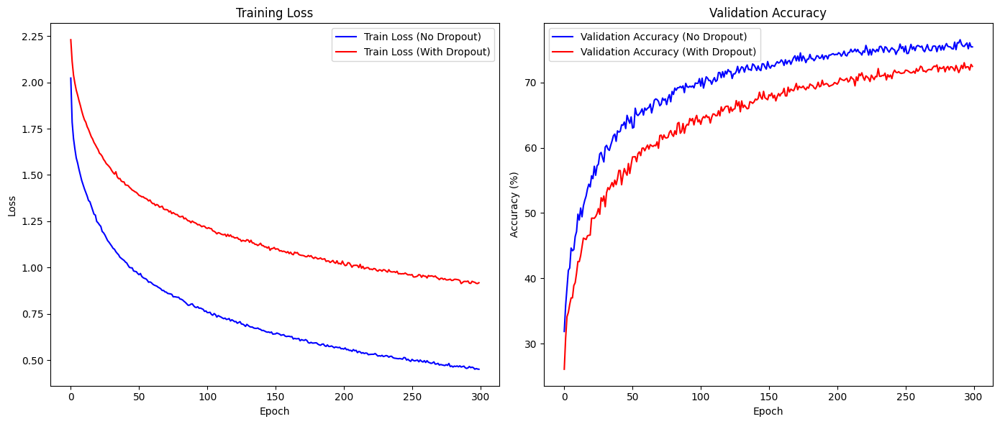

In [7]:
# Function to evaluate the model
def evaluate_model(model, data_loader, use_dropout=False):
    model.to(device)
    if not use_dropout:
        model.eval()
    else:
        model.train()  # Keep dropout layers active

    predictions, labels = [], []
    with torch.no_grad():
        for images, labels_batch in tqdm(data_loader, desc="Testing", leave=False):
            images, labels_batch = images.to(device), labels_batch.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            predictions.extend(predicted.cpu().numpy())
            labels.extend(labels_batch.cpu().numpy())

    accuracy = accuracy_score(labels, predictions) * 100
    return accuracy

# Evaluate the models on the test set
test_acc_no_dropout = evaluate_model(model_no_dropout, test_loader, use_dropout=False)
test_acc_with_dropout_no_dropout_inf = evaluate_model(model_with_dropout, test_loader, use_dropout=False)
test_acc_with_dropout_with_dropout_inf = evaluate_model(model_with_dropout, test_loader, use_dropout=True)

# Print test accuracies
print(f'Accuracy of the model without dropout: {test_acc_no_dropout:.2f}%')
print(f'Accuracy of the model with dropout (inference without dropout): {test_acc_with_dropout_no_dropout_inf:.2f}%')
print(f'Accuracy of the model with dropout (inference with dropout): {test_acc_with_dropout_with_dropout_inf:.2f}%')

# Plot training loss and validation accuracy
plt.figure(figsize=(14, 6))

# Plot Training Loss
plt.subplot(1, 2, 1)
plt.plot(train_losses_no_dropout, label='Train Loss (No Dropout)', color='blue')
plt.plot(train_losses_with_dropout, label='Train Loss (With Dropout)', color='red')
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Validation Accuracy
plt.subplot(1, 2, 2)
plt.plot(val_accuracies_no_dropout, label='Validation Accuracy (No Dropout)', color='blue')
plt.plot(val_accuracies_with_dropout, label='Validation Accuracy (With Dropout)', color='red')
plt.title('Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()

plt.tight_layout()
plt.show()
